In [1]:
%pylab inline

import keras.backend as K
from keras import Input, Model, Sequential
from keras.layers import *
from keras.optimizers import Adam, RMSprop, SGD
from keras.callbacks import *
from keras.losses import *
from keras.engine import InputSpec, Layer
from keras import initializers, regularizers, constraints
from keras.models import load_model
from keras.utils import plot_model
from keras.callbacks import EarlyStopping

import tensorflow as tf
from matplotlib import pyplot as plt

from datetime import datetime
from pathlib import Path

import pickle
import gc

from time import time
from scipy import signal

Populating the interactive namespace from numpy and matplotlib


/home/luca/.local/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [22]:
transactions_generator_inputs = Input((1,))

transactions_generator_outputs = Dense(90, activation='tanh')(transactions_generator_inputs)

transactions_model = Model(transactions_generator_inputs, transactions_generator_outputs)
transactions_model.compile(loss='mse', optimizer='adam')
transactions_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
dense_9 (Dense)              (None, 90)                180       
Total params: 180
Trainable params: 180
Non-trainable params: 0
_________________________________________________________________


In [23]:
transactions_model.weights

[<tf.Variable 'dense_9/kernel:0' shape=(1, 90) dtype=float32_ref>,
 <tf.Variable 'dense_9/bias:0' shape=(90,) dtype=float32_ref>]

In [24]:
generator_inputs = Input(batch_shape=(1, 90,))

latent_space = Dense(90, activation='elu')(generator_inputs)
latent_space = Dense(90, activation='elu')(latent_space)

latent_space = Dense(2, activation='tanh')(latent_space)
latent_space = Dense(90, activation='elu')(latent_space)
latent_space = Dense(90, activation='elu')(latent_space)

kernel_1 = Dense(1*90)(latent_space)
# kernel_1 = Reshape((1, 100))(kernel_1)

bias_1 = Dense(90)(latent_space)


generator_model = Model(generator_inputs, [kernel_1, bias_1])
generator_model.compile(loss='mse', optimizer='adam')
generator_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (1, 90)              0                                            
__________________________________________________________________________________________________
dense_10 (Dense)                (1, 90)              8190        input_4[0][0]                    
__________________________________________________________________________________________________
dense_11 (Dense)                (1, 90)              8190        dense_10[0][0]                   
__________________________________________________________________________________________________
dense_12 (Dense)                (1, 2)               182         dense_11[0][0]                   
__________________________________________________________________________________________________
dense_13 (

In [25]:
def split_data(dataset, timesteps):
    D = dataset.shape[1]
    if D < timesteps:
        return None
    elif D == timesteps:
        return dataset
    else:
        splitted_data, remaining_data = np.hsplit(dataset, [timesteps])
        remaining_data = split_data(remaining_data, timesteps)
        if remaining_data is not None:
            return np.vstack([splitted_data, remaining_data])
        return splitted_data

In [26]:
normalized_transactions_filepath = "../../datasets/berka_dataset/usable/normalized_transactions_months.npy"

timesteps = 90
transactions = np.load(normalized_transactions_filepath)
transactions = split_data(transactions, timesteps)
np.random.shuffle(transactions)

training_transactions = transactions[:45000]
test_transactions = transactions[-1000:]

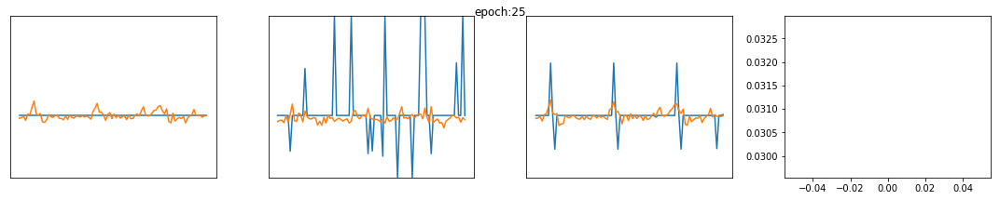

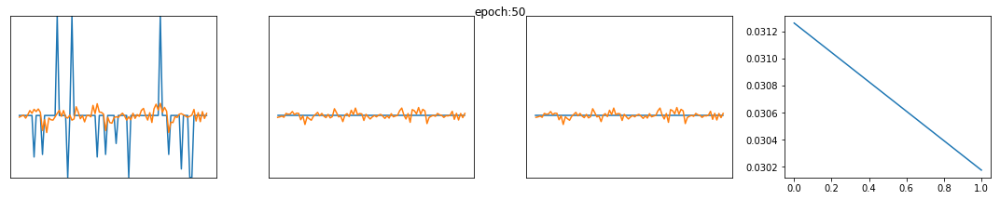

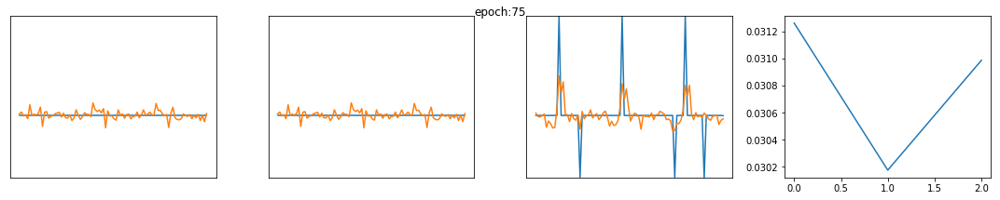

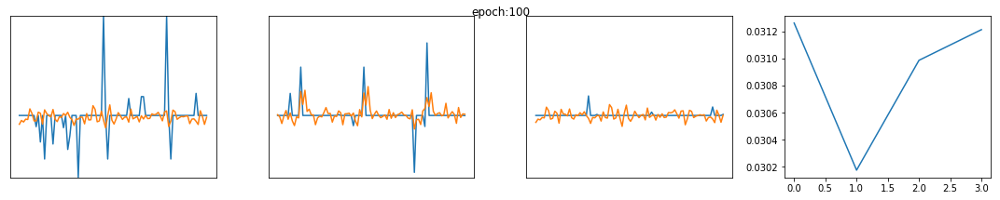

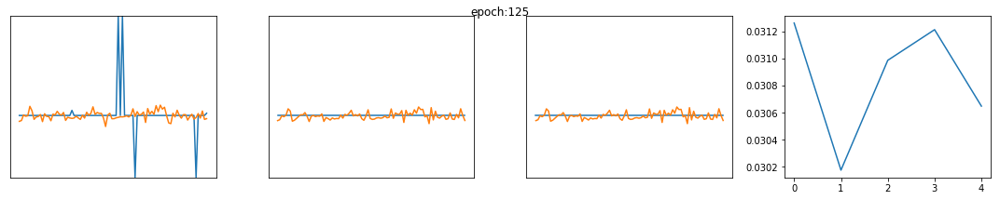

...

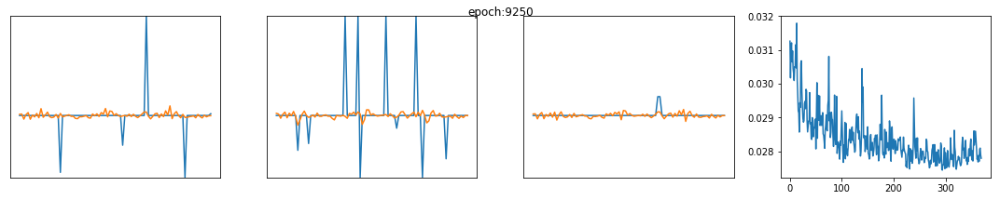

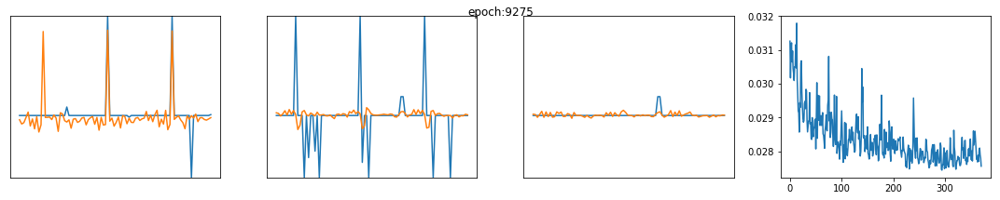

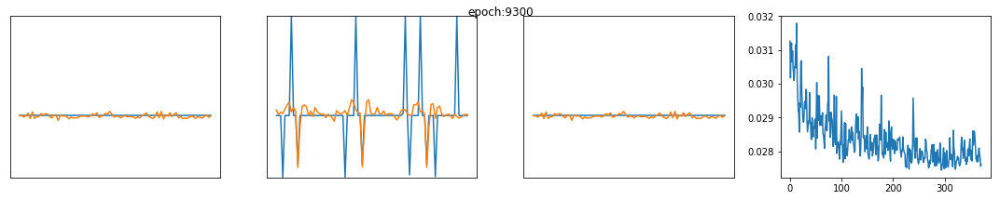

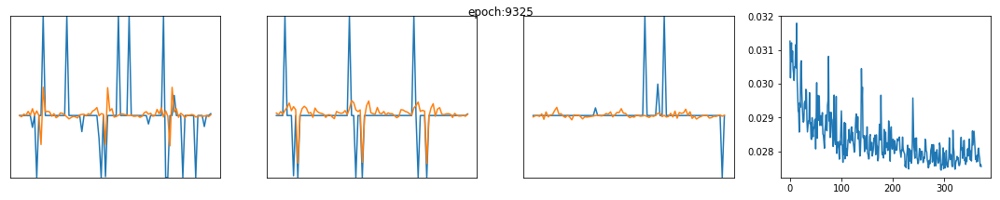

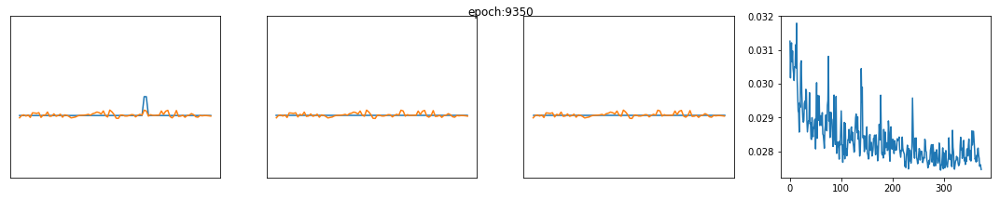

KeyboardInterrupt: 

In [42]:
batch_size = 100
fit_epochs_transaction_model = 1000
fit_epochs_generator_model = 1


epochs = 1000000

total_losses = []

early_stopping = EarlyStopping(monitor='loss', min_delta=0.0005, patience=2, verbose=0, mode='auto')

for i in range(1, epochs):
    ones_input = np.ones((batch_size, 1))
    sampled_input = training_transactions[np.random.choice(training_transactions.shape[0])].reshape(1, timesteps)
    repeated_sampled_input = np.tile(sampled_input, (batch_size, 1))

    [kernel_1, bias_1] = generator_model.predict(sampled_input)

    transactions_model.set_weights([kernel_1.reshape(1, 90), 
                                    bias_1.reshape(90)])
    
    transactions_model.fit(ones_input, repeated_sampled_input, epochs=fit_epochs_transaction_model, verbose=0, callbacks=[early_stopping])
    
    model_weights = transactions_model.get_weights()
    generator_model.fit(sampled_input, [model_weights[0].reshape(1, 90), 
                                    model_weights[1].reshape(1, 90)], epochs=fit_epochs_generator_model, verbose=0, callbacks=[early_stopping])
    
    if i%25 == 0:
        losses = []
        for transaction in test_transactions:
            test_input = transaction.reshape(1, timesteps)

            [kernel_1, bias_1] = generator_model.predict(test_input)

            transactions_model.set_weights([kernel_1.reshape(1, 90), 
                                        bias_1.reshape(90)])

            loss = transactions_model.evaluate(ones_input[0:1], test_input, verbose=0)
            losses.append(loss)
        average_loss = np.mean(np.array(losses))
        total_losses.append(average_loss)

    if i%25 == 0:
        plots_n = 3
        total_plots = plots_n + 1
        
        test_inputs = test_transactions[np.random.choice(test_transactions.shape[0], plots_n)]

        plt.subplots(1, total_plots, figsize=(15, 3))
        
        for j in range(plots_n):
            plt.subplot(1, total_plots, j+1)

            [kernel_1, bias_1] = generator_model.predict(test_inputs[j:j+1])
            transactions_model.set_weights([kernel_1.reshape(1, 90), 
                                        bias_1.reshape(90)])
            
            plt.plot(test_inputs[j].T)
            plt.plot(transactions_model.predict(ones_input[0:1]).T)
            plt.ylim([-1, 1])
            plt.yticks([])
            plt.xticks([])
        
        plt.subplot(1, total_plots, total_plots)
        plt.suptitle('epoch:' + str(i))
        plt.plot(total_losses)
        plt.tight_layout()
        plt.show()